In [1]:
# Importamos las librerías necesarias
from joblib import dump, load
import os
import rasterio
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
from scipy.stats import mode
from sklearn.preprocessing import normalize
from sklearn.cluster import KMeans
import cv2

def calcular_interseccion(caja1, caja2):
    x1, y1, w1, h1 = caja1
    x2, y2, w2, h2 = caja2

    xa = max(x1, x2)
    ya = max(y1, y2)
    xb = min(x1 + w1, x2 + w2)
    yb = min(y1 + h1, y2 + h2)

    inter_w = max(0, xb - xa)
    inter_h = max(0, yb - ya)

    return inter_w * inter_h

def calcular_giou(caja1, caja2):
    x1, y1, w1, h1 = caja1
    x2, y2, w2, h2 = caja2

    xa = max(x1, x2)
    ya = max(y1, y2)
    xb = min(x1 + w1, x2 + w2)
    yb = min(y1 + h1, y2 + h2)

    inter = calcular_interseccion(caja1, caja2)
    area1 = w1 * h1
    area2 = w2 * h2
    union = area1 + area2 - inter

    iou = inter / union if union > 0 else 0

    # Área mínima que cubre ambas cajas (caja envolvente)
    xc1 = min(x1, x2)
    yc1 = min(y1, y2)
    xc2 = max(x1 + w1, x2 + w2)
    yc2 = max(y1 + h1, y2 + h2)
    area_caja_envolvente = (xc2 - xc1) * (yc2 - yc1)

    giou = iou - ((area_caja_envolvente - union) / area_caja_envolvente)
    return giou





def supresion_jerarquica_por_contencion(cajas_por_capa, umbral_contencion=0.7):
    """
    Aplica supresión jerárquica basada en contención parcial, sin IoU.

    - Si una caja menos confiable (capa superior) contiene parcialmente
      a una caja más confiable (capa inferior) en cierto umbral, se elimina.

    Parámetros:
    - cajas_por_capa: lista de capas de menos a más confiables [[caja1, caja2, ...], ...]
    - umbral_contencion: proporción mínima del área de la caja más pequeña para considerar contención (0.7 por defecto)

    Retorna:
    - lista de cajas filtradas [x, y, w, h]
    """
    cajas_aceptadas = []

    for i in reversed(range(len(cajas_por_capa))):  # más profundas primero
        capa = cajas_por_capa[i]
        for nueva in capa:
            descartada = False
            for aceptada in cajas_aceptadas:
                if contiene_parcialmente(aceptada, nueva, umbral=umbral_contencion):
                    descartada = True
                    break
            if not descartada:
                # Eliminar aceptadas más superficiales contenidas por la nueva
                cajas_aceptadas = [
                    c for c in cajas_aceptadas if not contiene_parcialmente(nueva, c, umbral=umbral_contencion)
                ]
                cajas_aceptadas.append(nueva)

    return cajas_aceptadas

def contiene_parcialmente(caja_mayor, caja_menor, umbral=0.7):
    """
    Verifica si caja_mayor contiene parcialmente a caja_menor
    en al menos 'umbral' del área de la caja más pequeña.
    """
    x1, y1, w1, h1 = caja_mayor
    x2, y2, w2, h2 = caja_menor

    xa = max(x1, x2)
    ya = max(y1, y2)
    xb = min(x1 + w1, x2 + w2)
    yb = min(y1 + h1, y2 + h2)

    inter_area = max(0, xb - xa) * max(0, yb - ya)
    min_area = min(w1 * h1, w2 * h2)

    return inter_area >= umbral * min_area

def contiene(caja_grande, caja_pequena):
    """
    Verifica si una caja contiene totalmente a otra.
    """
    x1, y1, w1, h1 = caja_grande
    x2, y2, w2, h2 = caja_pequena

    return (x1 <= x2) and (y1 <= y2) and (x1 + w1 >= x2 + w2) and (y1 + h1 >= y2 + h2)



def distancia_centros(caja1, caja2):
    x1, y1, w1, h1 = caja1
    x2, y2, w2, h2 = caja2
    cx1, cy1 = x1 + w1 / 2, y1 + h1 / 2
    cx2, cy2 = x2 + w2 / 2, y2 + h2 / 2
    return np.sqrt((cx1 - cx2)**2 + (cy1 - cy2)**2)

def supresion_jerarquica_con_inversion(cajas_por_capa, iou_threshold=0.3, distancia_minima=47):
    """
    Variante de supresión jerárquica:
    - Prioriza cajas más profundas (últimas capas)
    - Elimina cajas de capas superiores si están contenidas por más profundas
    - Aplica una distancia mínima entre las cajas finales

    Parámetros:
    - cajas_por_capa: lista de capas, cada una con cajas [[x, y, w, h], ...], ordenadas de menor a mayor confianza
    - iou_threshold: umbral para eliminar por solapamiento
    - distancia_minima: distancia mínima entre centros de cajas finales

    Retorna:
    - lista de cajas finales
    """
    cajas_aceptadas = []

    for i in reversed(range(len(cajas_por_capa))):
        capa = cajas_por_capa[i]
        for nueva in capa:
            descartada = False
            for aceptada in cajas_aceptadas:
                if contiene(aceptada, nueva):
                    descartada = True
                    break
            if not descartada:
                # Eliminar menos confiables contenidas por la nueva
                cajas_aceptadas = [c for c in cajas_aceptadas if not contiene(nueva, c)]
                # Verificar IOU
                if all(calcular_iou(nueva, c) <= iou_threshold for c in cajas_aceptadas):
                    # Verificar distancia mínima entre centros
                    if all(distancia_centros(nueva, c) >= distancia_minima for c in cajas_aceptadas):
                        cajas_aceptadas.append(nueva)

    return cajas_aceptadas

def graficar_cajas(imagen, cajas, color=(0, 255, 0), grosor=2, titulo="Detecciones finales"):
    """
    Dibuja cajas sobre la imagen.

    Parámetros:
    - imagen: imagen base (RGB o BGR)
    - cajas: lista de cajas [x, y, w, h]
    - color: color de las cajas (por defecto verde)
    - grosor: grosor de las líneas
    - titulo: título de la visualización
    """
    img_vis = imagen.copy()

    # Si la imagen es RGB (matplotlib), convertir a BGR para dibujar
    if img_vis.shape[2] == 3 and img_vis.dtype == np.uint8:
        img_vis = cv2.cvtColor(img_vis, cv2.COLOR_RGB2BGR)

    for (x, y, w, h) in cajas:
        cv2.rectangle(img_vis, (x, y), (x + w, y + h), color, grosor)

    # Volver a RGB para mostrar con matplotlib
    img_vis = cv2.cvtColor(img_vis, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(12, 12))
    plt.imshow(img_vis)
    plt.title(titulo)
    plt.axis("off")
    plt.show()

def calcular_iou(caja1, caja2):
    """Calcula IoU entre dos cajas (x, y, w, h)."""
    x1, y1, w1, h1 = caja1
    x2, y2, w2, h2 = caja2

    xa = max(x1, x2)
    ya = max(y1, y2)
    xb = min(x1 + w1, x2 + w2)
    yb = min(y1 + h1, y2 + h2)

    inter_area = max(0, xb - xa) * max(0, yb - ya)
    area1 = w1 * h1
    area2 = w2 * h2
    union_area = area1 + area2 - inter_area

    if union_area == 0:
        return 0.0
    return inter_area / union_area


def supresion_jerarquica_detecciones(cajas_por_capa, iou_threshold=0.3):
    """
    Aplica supresión jerárquica preservando cajas de capas más profundas (más confiables).

    Parámetros:
    - cajas_por_capa: lista de capas, cada una con una lista de cajas [[x, y, w, h], ...],
                      en orden de menor a mayor umbral (menos a más confiables).
    - iou_threshold: umbral de IoU para eliminar duplicados (por defecto 0.3)

    Retorna:
    - lista de cajas finales [x, y, w, h]
    """
    cajas_aceptadas = []

    # Procesamos capas de mayor a menor confianza
    for capa in reversed(cajas_por_capa):
        for nueva in capa:
            # Si NO se solapa con ninguna aceptada → la agregamos
            if all(calcular_iou(nueva, aceptada) <= iou_threshold for aceptada in cajas_aceptadas):
                cajas_aceptadas.append(nueva)

    return cajas_aceptadas


def generar_patches_solapados(imagen, tamano=150, stride=50):
    """
    Divide la imagen en parches RGB con o sin solapamiento.

    Parámetros:
    - imagen: array (alto, ancho, 3)
    - tamano: tamaño del parche en píxeles (default=200)
    - stride: cantidad de píxeles entre parches (default=200). Si stride < tamano hay solapamiento.

    Retorna:
    - lista de parches (cada uno es un array (tamano, tamano, 3))
    """
    alto, ancho, _ = imagen.shape
    parches = []

    for y in range(0, alto - tamano + 1, stride):
        for x in range(0, ancho - tamano + 1, stride):
            parche = imagen[y:y+tamano, x:x+tamano]
            parches.append(parche)

    print(f"Se generaron {len(parches)} parches de {tamano}x{tamano} con stride {stride}")
    return parches

def construir_vectores_caracteristicas(parches, bins=256):
    """
    Construye vectores de características a partir de histogramas RGB de cada parche.

    Parámetros:
    - parches: lista de arrays (alto, ancho, 3)
    - bins: número de bins por histograma (por defecto 256)

    Retorna:
    - X: array numpy de forma (n_patches, bins * 3)
    """
    caracteristicas = []

    for parche in parches:
        vector = []
        for i in range(3):  # R, G, B
            hist, _ = np.histogram(parche[:, :, i], bins=bins, range=(0, 256), density=True)
            vector.extend(hist)
        caracteristicas.append(vector)

    X = np.array(caracteristicas)
    print(f"Se construyó una matriz de características con forma: {X.shape}")
    return X


def aplicar_kmeans(X, n_clusters=4, random_state=42):
    """
    Aplica K-Means sobre la matriz de características.

    Parámetros:
    - X: array de forma (n_patches, n_features)
    - n_clusters: número de grupos a generar
    - random_state: semilla para reproducibilidad

    Retorna:
    - labels: array con la etiqueta de cluster para cada parche
    - modelo_kmeans: el objeto KMeans entrenado
    """
    print(f"Aplicando K-Means con {n_clusters} clusters...")
    kmeans = KMeans(n_clusters=n_clusters, random_state=random_state,)
    labels = kmeans.fit_predict(X)
    print("K-Means finalizado.")
    return labels, kmeans

def visualizar_histogramas_promedio(X, labels, bins=256):
    """
    Visualiza los histogramas promedio por clúster (una gráfica por clúster, con subgráficos R-G-B).

    Parámetros:
    - X: matriz de características (n_samples, 768)
    - labels: etiquetas de clúster
    - bins: número de bins usados en cada histograma
    """
    n_clusters = len(np.unique(labels))
    colores = ['red', 'green', 'blue']
    titulos = ['Rojo (R)', 'Verde (G)', 'Azul (B)']

    for cl in range(n_clusters):
        indices = np.where(labels == cl)[0]
        hist_cl = X[indices]  # Subconjunto del clúster
        promedio = hist_cl.mean(axis=0)

        fig, axes = plt.subplots(1, 3, figsize=(15, 4))
        fig.suptitle(f"Histograma promedio - Clúster {cl}", fontsize=14)

        for i in range(3):
            inicio = i * bins
            fin = (i + 1) * bins
            axes[i].plot(promedio[inicio:fin], color=colores[i])
            axes[i].set_title(titulos[i])
            axes[i].set_xlabel("Intensidad")
            axes[i].set_ylabel("Frecuencia")
            axes[i].set_xlim(0, bins - 1)

        plt.tight_layout()
        plt.show()


def visualizar_mapa_clusters_coloreado(imagen, modelo, tamano=200, stride=200, normalizar=True, alpha=0.4,clustersP=[1,2],Title="Mapa de clústeres sobre imagen",bins=256):
    """
    Visualiza la imagen original superpuesta con colores por clúster (con transparencia).

    Parámetros:
    - imagen: imagen RGB original (H x W x 3)
    - modelo: modelo KMeans entrenado
    - tamano: tamaño del parche (en píxeles)
    - stride: paso entre parches
    - normalizar: si se normaliza el histograma como en el entrenamiento
    - alpha: transparencia del overlay (0 a 1)
    - clustersP: Clusters para visualizar
    """
    alto, ancho, _ = imagen.shape
    cluster_map = np.zeros_like(imagen, dtype=np.uint8)

    # Paleta de colores por clúster
    np.random.seed(42)  # Semilla para colores consistentes
    colores_cluster = np.random.randint(0, 255, size=(len(clustersP), 3), dtype=np.uint8)

    for y in range(0, alto - tamano + 1, stride):
        for x in range(0, ancho - tamano + 1, stride):
            parche = imagen[y:y+tamano, x:x+tamano]
            if parche.shape[0] == tamano and parche.shape[1] == tamano:
                # Vector de histograma
                vector = []
                for i in range(3):
                    hist, _ = np.histogram(parche[:, :, i], bins=bins, range=(0, 256), density=normalizar)
                    vector.extend(hist)
                vector = np.array(vector).reshape(1, -1)
                vector=normalize(vector,"l2")
                # Predicción de clúster
                cluster = modelo.predict(vector)[0]
                

                # Pintamos el parche en el mapa de clúster
                if cluster in clustersP:
                    color = colores_cluster[clustersP.index(cluster)]
                    cluster_map[y:y+tamano, x:x+tamano] = color
                else:
                    cluster_map[y:y+tamano, x:x+tamano]=0


    # Mostrar imagen original + superposición de clúster
    plt.figure(figsize=(12, 12))
    plt.imshow(imagen)
    plt.imshow(cluster_map, alpha=alpha)
    plt.title(Title)
    plt.axis("off")
    plt.show()



def mostrar_ejemplos_cluster(parches, labels, cluster=0, max_muestras=10):
    """
    Muestra una galería de imágenes de ejemplo para un clúster específico.

    Parámetros:
    - parches: lista de arrays (cada uno es un parche RGB)
    - labels: etiquetas del clúster para cada parche
    - cluster: número de clúster a mostrar
    - max_muestras: cantidad de parches a mostrar (por defecto 10)
    """
    indices = np.where(labels == cluster)[0]
    
    if len(indices) == 0:
        print(f"No hay parches asignados al clúster {cluster}.")
        return

    muestras = indices[:max_muestras]  # Tomamos las primeras N
    n = len(muestras)

    cols = 5
    rows = (n + cols - 1) // cols

    fig, axes = plt.subplots(rows, cols, figsize=(15, 3 * rows))
    fig.suptitle(f"{n} ejemplos del clúster {cluster}", fontsize=16)

    for i in range(rows * cols):
        ax = axes[i // cols, i % cols] if rows > 1 else axes[i]
        if i < n:
            ax.imshow(parches[muestras[i]])
            ax.set_title(f"Parche #{muestras[i]}")
        ax.axis('off')

    plt.tight_layout()
    plt.show()

def construir_vectores_caracteristicas_HSV(parches, bins=256):
    """
    Construye vectores de características a partir de histogramas HSV de cada parche.

    Parámetros:
    - parches: lista de arrays (H, W, 3) en formato HSV
    - bins: número de bins por histograma

    Retorna:
    - X: array (n_patches, bins * 3)
    """
    caracteristicas = []

    for parche in parches:
        vector = []

        # H (0–180)
        hist_H, _ = np.histogram(parche[:, :, 0], bins=int(bins*180/256), range=(0, 180), density=True)
        vector.extend(hist_H)

        # S y V (0–256)
        for i in [1, 2]:
            hist, _ = np.histogram(parche[:, :, i], bins=bins, range=(0, 256), density=True)
            vector.extend(hist)

        caracteristicas.append(vector)

    X = np.array(caracteristicas)
    print(f"Se construyó una matriz de características HSV con forma: {X.shape}")
    return X
import matplotlib.pyplot as plt


def visualizar_histogramas_promedio_HSV(X, labels, bins=256):
    """
    Visualiza los histogramas promedio por clúster en espacio HSV.

    Parámetros:
    - X: matriz de características (n_samples, bins*3)
    - labels: etiquetas de clúster
    - bins: número de bins por histograma
    """
    n_clusters = len(np.unique(labels))
    colores = ['purple', 'green', 'orange']
    titulos = ['Tono (H)', 'Saturación (S)', 'Brillo (V)']

    for cl in range(n_clusters):
        indices = np.where(labels == cl)[0]
        hist_cl = X[indices]
        promedio = hist_cl.mean(axis=0)

        fig, axes = plt.subplots(1, 3, figsize=(15, 4))
        fig.suptitle(f"Histograma promedio HSV - Clúster {cl}", fontsize=14)
        binsV=int(bins*180/256)
        for i in range(3):
            if i==0:
                inicio = i * binsV
                fin = (i + 1) * binsV
                axes[i].plot(promedio[inicio:fin], color=colores[i])
                axes[i].set_title(titulos[i])
                axes[i].set_xlabel("Intensidad")
                axes[i].set_ylabel("Frecuencia")
                axes[i].set_xlim(0, binsV - 1)
            else: 
                inicio = (i-1) * bins+binsV
                fin = (i) * bins+binsV
                axes[i].plot(promedio[inicio:fin], color=colores[i])
                axes[i].set_title(titulos[i])
                axes[i].set_xlabel("Intensidad")
                axes[i].set_ylabel("Frecuencia")
                axes[i].set_xlim(0, bins - 1)

        plt.tight_layout()
        plt.show()

def visualizar_mapa_clusters_coloreado_HSV(imagen_hsv, modelo, tamano=200, stride=200, normalizar=True,
                                           alpha=0.4, clustersP=[1, 2], Title="Mapa de clústeres HSV", bins=256):
    """
    Visualiza la imagen original RGB superpuesta con colores por clúster basado en características HSV.

    Parámetros:
    - imagen_hsv: imagen HSV original (H x W x 3)
    - modelo: modelo KMeans entrenado
    - tamano: tamaño del parche (en píxeles)
    - stride: paso entre parches
    - normalizar: normalizar los histogramas
    - alpha: transparencia del overlay
    - clustersP: Clústeres a mostrar
    - Title: título del gráfico
    - bins: número de bins por histograma
    """
    alto, ancho, _ = imagen_hsv.shape
    cluster_map = np.zeros((alto, ancho, 3), dtype=np.uint8)

    np.random.seed(42)
    colores_cluster = np.random.randint(0, 255, size=(len(clustersP), 3), dtype=np.uint8)

    for y in range(0, alto - tamano + 1, stride):
        for x in range(0, ancho - tamano + 1, stride):
            parche = imagen_hsv[y:y+tamano, x:x+tamano]
            if parche.shape[0] == tamano and parche.shape[1] == tamano:
                vector = []

                hist_H, _ = np.histogram(parche[:, :, 0], bins=int(bins*180/256), range=(0, 180), density=True)
                vector.extend(hist_H)

                for i in [1, 2]:
                    hist, _ = np.histogram(parche[:, :, i], bins=bins, range=(0, 256), density=True)
                    vector.extend(hist)

                vector = np.array(vector).reshape(1, -1)
                

                cluster = modelo.predict(vector)[0]

                if cluster in clustersP:
                    color = colores_cluster[clustersP.index(cluster)]
                    cluster_map[y:y+tamano, x:x+tamano] = color
                else:
                    cluster_map[y:y+tamano, x:x+tamano] = 0

    # Mostrar la imagen RGB original con el overlay
    imagen_rgb = cv2.cvtColor(imagen_hsv, cv2.COLOR_HSV2RGB)

    plt.figure(figsize=(12, 12))
    plt.imshow(imagen_rgb)
    plt.imshow(cluster_map, alpha=alpha)
    plt.title(Title)
    plt.axis("off")
    plt.show()



def reconstruir_mapa_clusters(imagen,X, model, tamano=200, stride=100, cluster_prioritario=[0],umbral=2):
    """
    Reconstruye un mapa de etiquetas por pixel a partir de los parches, asignando por moda,
    pero con prioridad absoluta al clúster indicado si está presente en los votos.

    Parámetros:
    - imagen: array RGB (H x W x 3)
    - labels: lista de etiquetas (1 por parche)
    - tamano: tamaño del parche
    - stride: desplazamiento entre parches
    - cluster_prioritario: etiqueta a priorizar si está presente (por defecto 2)

    Retorna:
    - mapa_etiquetas: array 2D (H x W) con etiquetas por pixel
    """
    alto, ancho, _ = imagen.shape
    labels=model.predict(X)
    # Creamos una matriz de listas para almacenar los votos
    votos = np.empty((alto, ancho), dtype=object)
    for y in range(alto):
        for x in range(ancho):
            votos[y, x] = []

    index = 0
    for y in range(0, alto - tamano + 1, stride):
        for x in range(0, ancho - tamano + 1, stride):
            if index >= len(labels):
                break
            etiqueta = labels[index]
            for i in range(y, y + tamano):
                for j in range(x, x + tamano):
                    votos[i, j].append(etiqueta)
            index += 1
            #print(index)

    # Creamos el mapa final aplicando la prioridad
    mapa_etiquetas = np.zeros((alto, ancho), dtype=np.uint8)
    for y in range(alto):
        for x in range(ancho):
            
            if votos[y, x]:
                
                if sum([votos[y, x].count(cl) for cl in cluster_prioritario])>umbral :
                        mapa_etiquetas[y, x] = 1
                else:
                    mapa_etiquetas[y, x] = 0
            else:
                mapa_etiquetas[y, x] = 0  # sin voto
       
    return mapa_etiquetas

def visualizar_mapa_reconstruido(imagen, mapa_etiquetas, cluster_destacado=1, alpha=0.5, color_destacado=(255, 0, 0)):
    """
    Muestra la imagen con superposición solo del clúster deseado, en color y con transparencia.

    Parámetros:
    - imagen: array RGB original
    - mapa_etiquetas: array 2D (H x W) con etiquetas por pixel
    - cluster_destacado: número de clúster a mostrar
    - alpha: transparencia del overlay
    - color_destacado: tupla RGB para el color del clúster (por defecto rojo)
    """
    alto, ancho, _ = imagen.shape
    overlay = np.zeros((alto, ancho, 3), dtype=np.uint8)

    # Asignamos color solo donde el cluster coincide
    mascara = (mapa_etiquetas == cluster_destacado)
    overlay[mascara] = color_destacado

    # Mostrar con transparencia
    plt.figure(figsize=(12, 12))
    plt.imshow(imagen)
    plt.imshow(overlay, alpha=alpha)
    plt.title(f"Región del clúster {cluster_destacado}", fontsize=14)
    plt.axis("off")
    plt.show()


def dilatacion_mascara_cluster(mapa_clusters, cluster_id, kernel_size=3, iteraciones=1):
    """
    Aplica dilatación a la máscara binaria de un clúster específico.

    Parámetros:
    - mapa_clusters: array 2D con etiquetas por píxel
    - cluster_id: número del clúster a procesar
    - kernel_size: tamaño del elemento estructurante (default 3x3)
    - iteraciones: cantidad de dilataciones consecutivas

    Retorna:
    - mascara_dilatada: array binario 2D después de la dilatación
    """
    # Crear máscara binaria donde el cluster coincide
    mascara = (mapa_clusters == cluster_id).astype(np.uint8)

    # Crear kernel
    kernel = np.ones((kernel_size, kernel_size), np.uint8)

    # Aplicar dilatación
    mascara_dilatada = cv2.dilate(mascara, kernel, iterations=iteraciones)

    return mascara_dilatada


def erosion_mascara_cluster(mapa_clusters, cluster_id, iteraciones=1,kernel = np.ones((3, 3), np.uint8)):
    """
    Aplica erosión a la máscara binaria de un clúster específico.

    Parámetros:
    - mapa_clusters: array 2D con etiquetas por píxel
    - cluster_id: número del clúster a procesar
    - kernel_size: tamaño del elemento estructurante (ej. 3)
    - iteraciones: cantidad de erosiones consecutivas

    Retorna:
    - mascara_erodida: array binario 2D después de la erosión
    """
    # Crear la máscara binaria
    mascara = (mapa_clusters == cluster_id).astype(np.uint8)

   
    # Aplicar erosión
    mascara_erodida = cv2.erode(mascara, kernel, iterations=iteraciones)

    return mascara_erodida

C:\Users\EsSe009\citrus3-detector\data\database\test\tif_1x_res\database_batch_5.tif
Se generaron 34595 parches de 39x39 con stride 13
Se construyó una matriz de características con forma: (34595, 96)


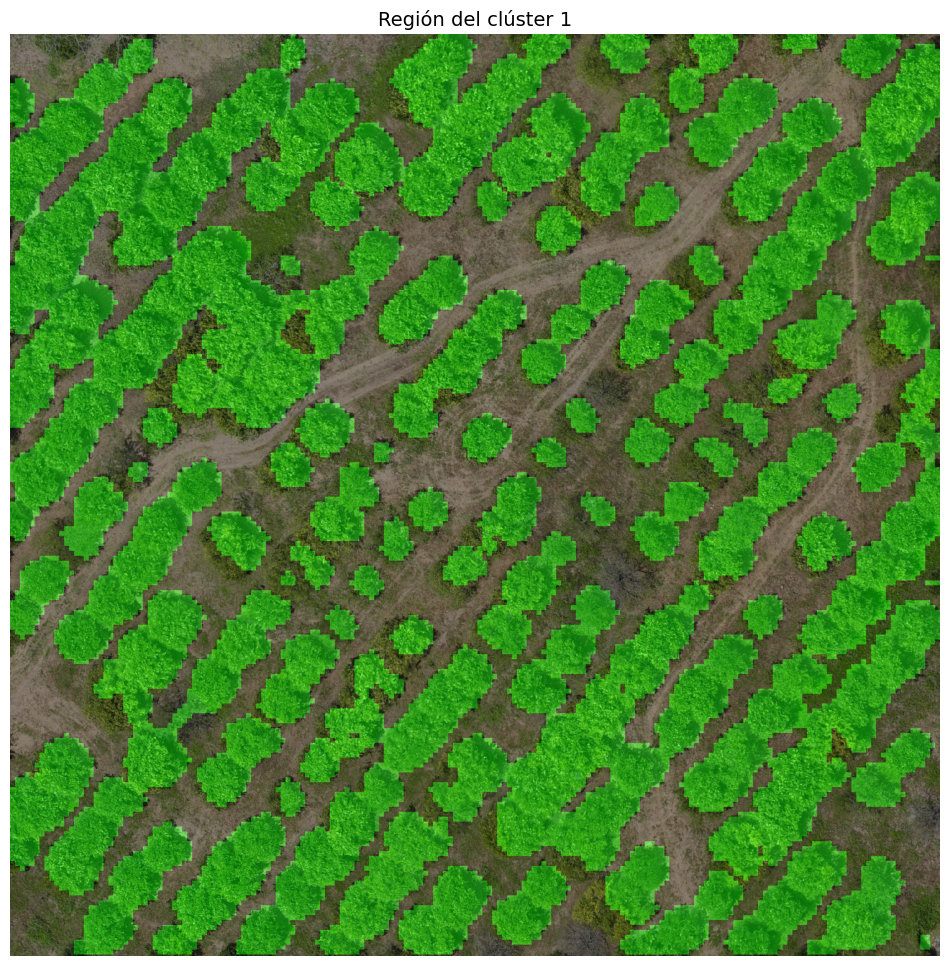

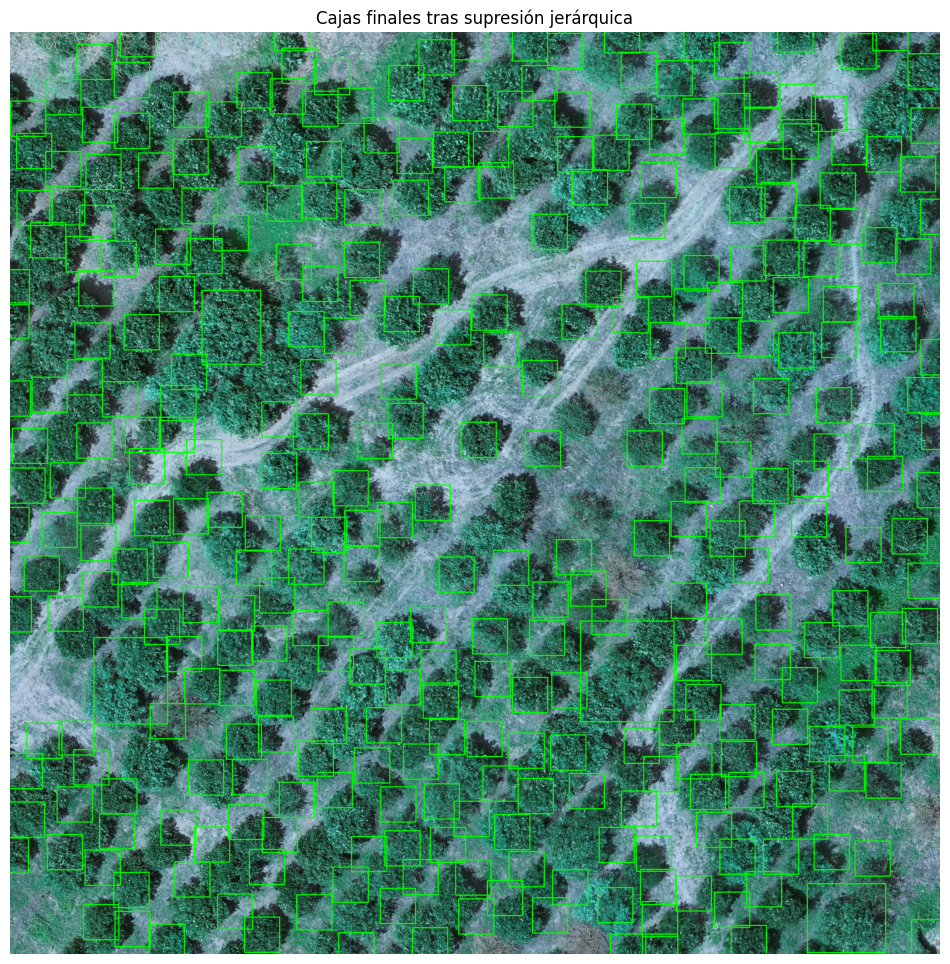

C:\Users\EsSe009\citrus3-detector\data\database\test\tif_1x_res\database_batch_9.tif
Se generaron 39000 parches de 39x39 con stride 13
Se construyó una matriz de características con forma: (39000, 96)


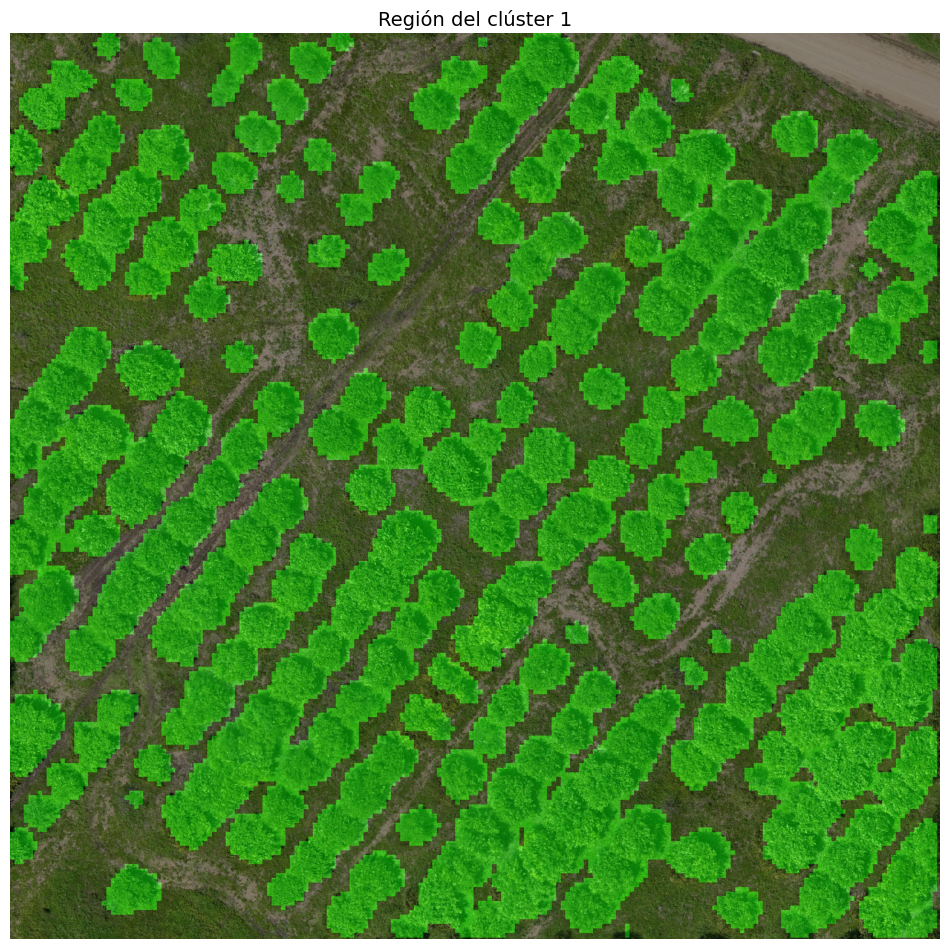

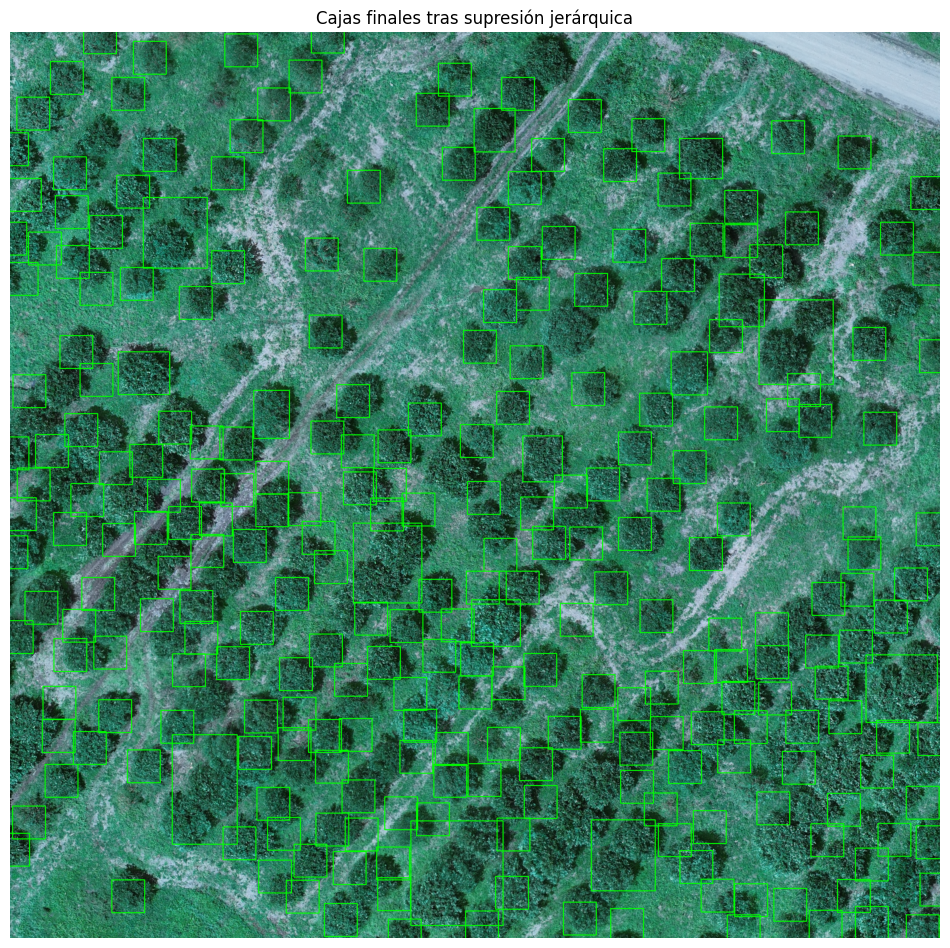

C:\Users\EsSe009\citrus3-detector\data\database\test\tif_1x_res\database_batch_17.tif
Se generaron 41567 parches de 39x39 con stride 13
Se construyó una matriz de características con forma: (41567, 96)


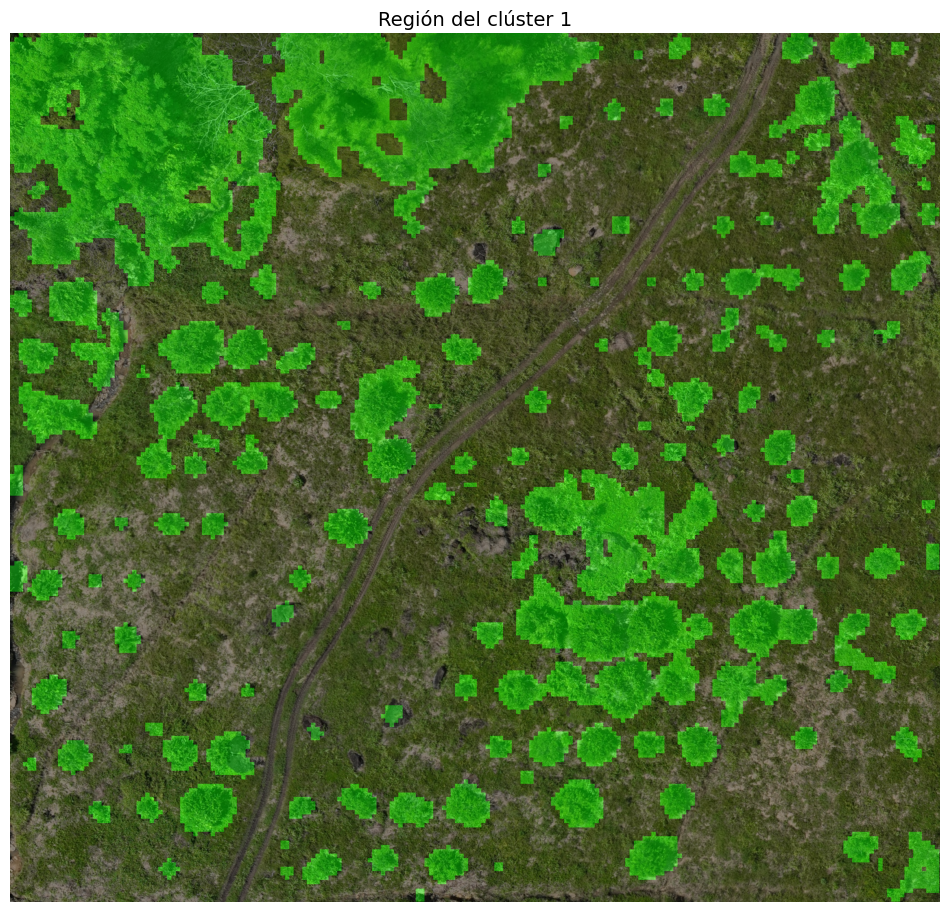

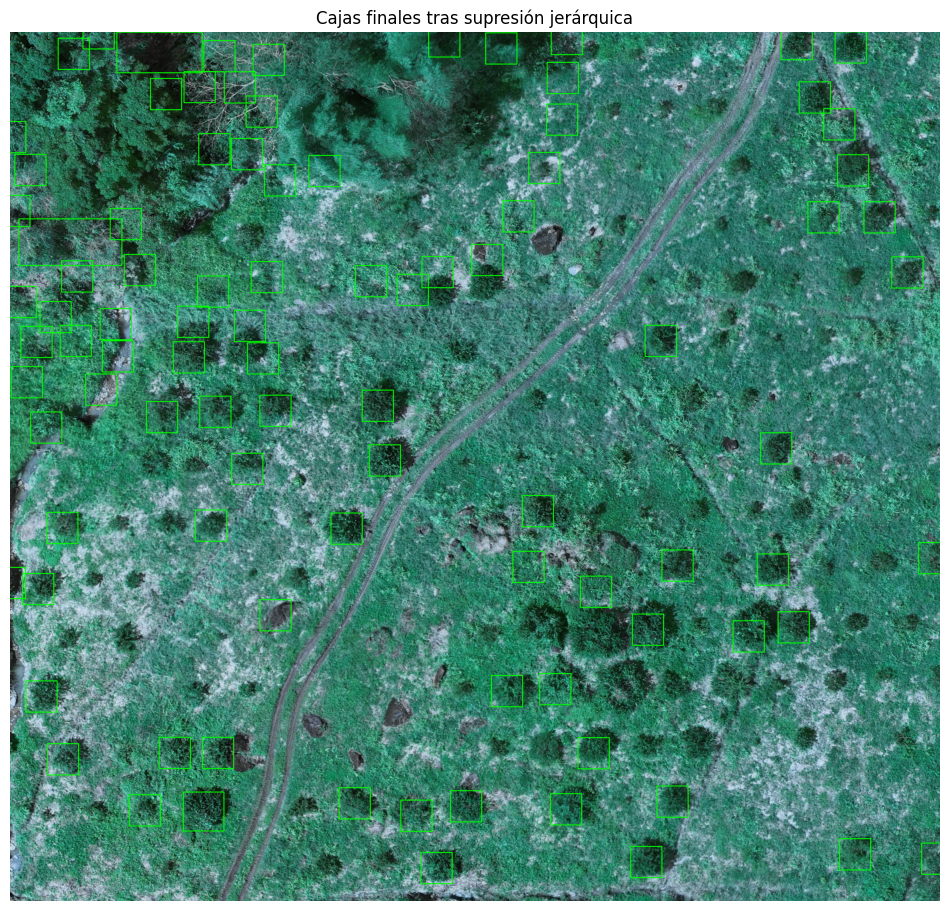

C:\Users\EsSe009\citrus3-detector\data\database\test\tif_1x_res\database_batch_1.tif
Se generaron 51968 parches de 39x39 con stride 13
Se construyó una matriz de características con forma: (51968, 96)


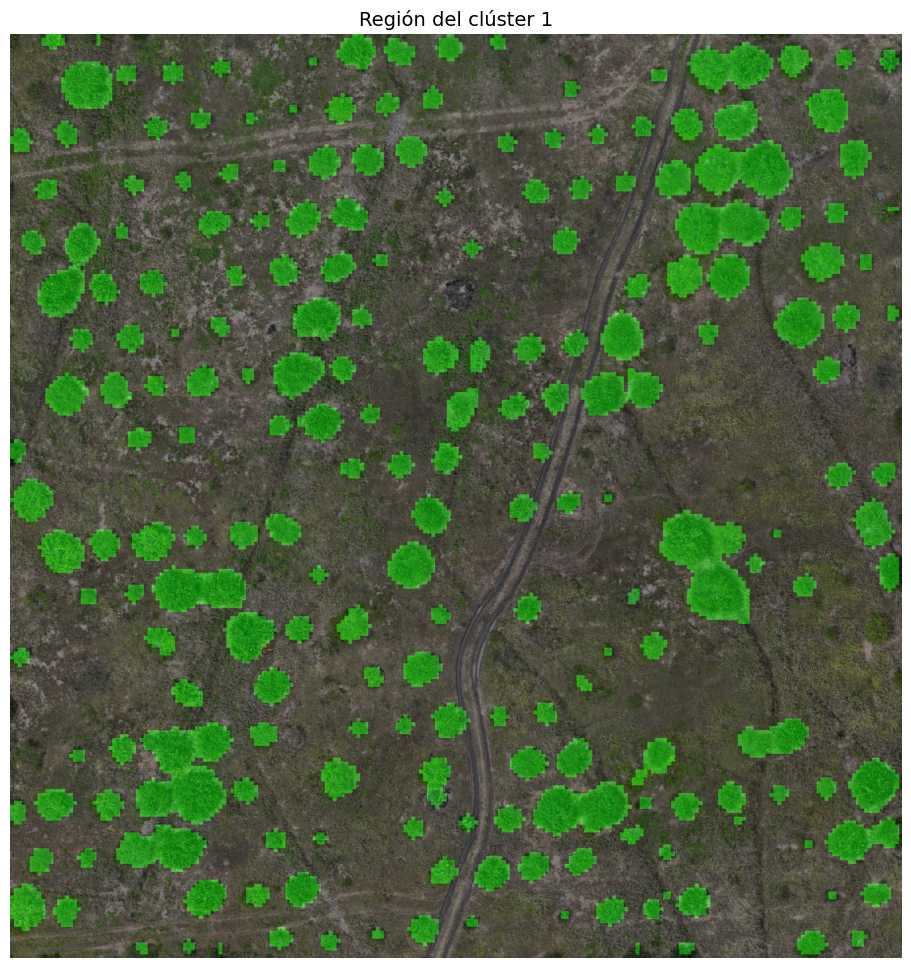

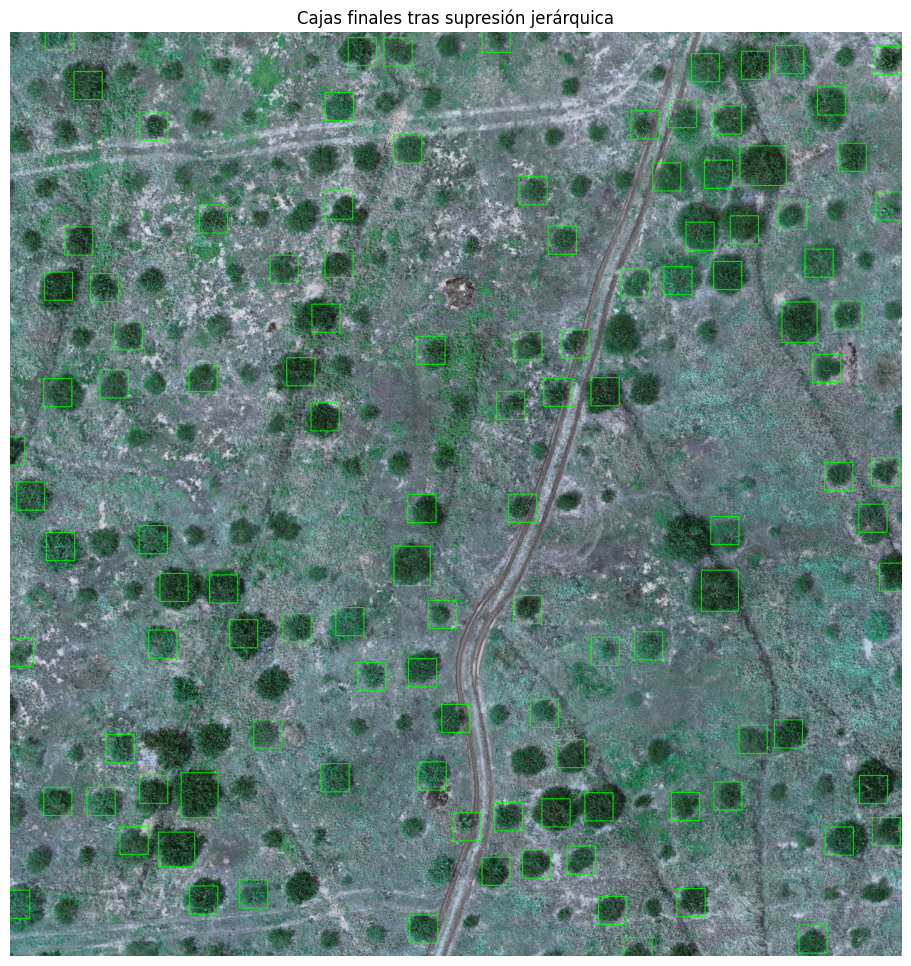

In [2]:
Ruta=r"C:\Users\EsSe009\citrus3-detector\data\database\test\tif_1x_res"
Ruta_E=r"C:\Users\EsSe009\citrus3-detector\data\database\test\tif_elev"
modelo_rgb = load('modelo_rgb.joblib')
Xs=[]
Reso=1
archivos = [
 'database_batch_5.tif',
 'database_batch_9.tif',
 'database_batch_17.tif',
 'database_batch_1.tif',
]


Str=13//Reso
Tam=39//Reso
Area=25//Reso
Cajas_total=[]
for imm in archivos:
    
    imagen_tiff = os.path.join(Ruta,imm)
    print(imagen_tiff)
    with rasterio.open(imagen_tiff) as src:
        imagen = src.read()
        imagen = np.transpose(imagen, (1, 2, 0))  # Reordenar a (alto, ancho, bandas)
        imagen=cv2.resize(imagen, (imagen.shape[1]//Reso, imagen.shape[0]//Reso), interpolation=cv2.INTER_CUBIC)
    Elevacion_imagen_tiff=os.path.join(Ruta_E,imm)
    # Cargar y procesar imagen
    with rasterio.open(Elevacion_imagen_tiff) as src:
        Elevation_imagen = src.read()
        Elevation_imagen = np.transpose(Elevation_imagen, (1, 2, 0)).astype('float32')
        Elevation_imagen[Elevation_imagen == -3.4028235e+38] = np.nan  # invalid values
        elev=cv2.resize(Elevation_imagen, (imagen.shape[1], imagen.shape[0]), interpolation=cv2.INTER_CUBIC)
    #hsv  = cv2.cvtColor(imagen, cv2.COLOR_RGB2HSV)
    parches_i=generar_patches_solapados(imagen,Tam,Str)
    #parches_j=generar_patches_solapados(hsv,Tam,Str)
    Xi=construir_vectores_caracteristicas(parches_i,32)
    #Xj=construir_vectores_caracteristicas_HSV(parches_j,32)
    Xji=Xi

    Etiquetas=reconstruir_mapa_clusters(imagen=imagen,X=Xji,model=modelo_rgb,tamano=Tam,stride=Str,cluster_prioritario=[9,5,3,1],umbral=2)
    visualizar_mapa_reconstruido(imagen,Etiquetas,1,0.4,[0,255,0])
    # Sustituir NaN por el mínimo válido real
    elev_sin_nan = elev.copy()
    elev_sin_nan[np.isnan(elev)] = np.nanmin(elev)

    # Suavizado del terreno (ajusta kernel)
    k_size=1800//Reso+1
    suavizado = cv2.GaussianBlur(elev_sin_nan, (k_size, k_size), sigmaX=0)
    k_size2=24//Reso+1
# Resaltar elevaciones puntuales (posibles árboles)
    relieve_residual = elev_sin_nan - suavizado
    relieve_residual= np.abs(cv2.GaussianBlur(relieve_residual, (k_size2, k_size2), sigmaX=0))
   

    
    BoxesImm=[]
    for uu in [0.3,0.6,0.9,1.2,1.5,1.8,2.1]:
        # Opcional: solo destacar elevaciones mayores a cierto umbral
        residual_filtrado = np.where(relieve_residual > uu, relieve_residual, 0)  # umbral inferior
        residual_filtrado = np.where(residual_filtrado< 6.3,residual_filtrado,0)  # límite superior a 5
       
        Mapa = (Etiquetas * residual_filtrado).astype(np.uint8)
        num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(Mapa, connectivity=4)
        # Visualización
        imagen_blob = imagen.copy()
        Cajas_Capa=[]
        for i in range(1, num_labels):  # Omitimos fondo (label 0)
            x, y, w, h, area = stats[i]
            cx, cy = centroids[i]
            if area<9/(0.032**2)//Reso:
                x=int((cx-1.5/0.032)  //Reso)
                y=int((cy-1.5/0.032)//Reso)
                w=int((3/0.032)//Reso)
                h=int((3/0.032)//Reso)
                Cajas_Capa.append([x,y,w,h])
            elif area<Area/(0.032**2)//Reso:
                Cajas_Capa.append([x,y,w,h])
            # Dibujar rectángulo
            

        # Mostrar
        BoxesImm.append(Cajas_Capa)
       
    Resultado=supresion_jerarquica_con_inversion(BoxesImm,iou_threshold=0.05)
    graficar_cajas(imagen, Resultado, color=(0, 255, 0), grosor=2, titulo="Cajas finales tras supresión jerárquica")
    Cajas_total.append(Resultado)
    

In [3]:
import pandas as pd
from PIL import Image
registros = []
for nombre, cajas in zip(archivos, Cajas_total):
    for (x, y, w, h) in cajas:
        registros.append({
            "imagen": nombre,
            "x": x,
            "y": y,
            "w": w,
            "h": h
        })

# Crear DataFrame
df_val = pd.DataFrame(registros)
df_val['image_path'] = df_val['imagen']
print(df_val)

                   imagen     x     y    w    h            image_path
0    database_batch_5.tif  1570   -38   93   93  database_batch_5.tif
1    database_batch_5.tif  1780   -19   93   93  database_batch_5.tif
2    database_batch_5.tif  1327   -17   93   93  database_batch_5.tif
3    database_batch_5.tif   291   -28   93   93  database_batch_5.tif
4    database_batch_5.tif  2195     4   93   93  database_batch_5.tif
..                    ...   ...   ...  ...  ...                   ...
823  database_batch_1.tif  2325  2478   93   93  database_batch_1.tif
824  database_batch_1.tif  2185  2513   93   93  database_batch_1.tif
825  database_batch_1.tif   491  2644  119  115  database_batch_1.tif
826  database_batch_1.tif  1840  2690   93   93  database_batch_1.tif
827  database_batch_1.tif  2203  2831   93   93  database_batch_1.tif

[828 rows x 6 columns]


In [4]:
import pandas as pd

# Cargar correctamente
df_labels = pd.read_csv(r"C:\Users\EsSe009\citrus3-detector\data\labels\labels_tifname_porcentual.csv")

# Filtrar clases deseadas
df_labels = df_labels[df_labels['label'].isin(['Lemon', 'Orange'])]
df_labels = df_labels[df_labels['image_path'].isin(archivos)]
# Convertir de (xmin, ymin, xmax, ymax) → (x, y, w, h)
df_labels['x'] = df_labels['xmin']
df_labels['y'] = df_labels['ymin']
df_labels['w'] = df_labels['xmax'] - df_labels['xmin']
df_labels['h'] = df_labels['ymax'] - df_labels['ymin']

# Asegurarte que son floats válidos (evita errores al multiplicar)
df_labels[['x', 'y', 'w', 'h']] = df_labels[['x', 'y', 'w', 'h']].astype(float)

from PIL import Image
import os

# Ruta a las imágenes PNG
ruta_pngs = r"C:\Users\EsSe009\citrus3-detector\data\database\test\tif_1x_res"

# Obtener dimensiones de cada imagen
def obtener_dimensiones_png(nombre_png):
    ruta = os.path.join(ruta_pngs, nombre_png)
    with Image.open(ruta) as im:
        return im.size  # (ancho, alto)

# Crear columnas absolutas
x_px, y_px, w_px, h_px = [], [], [], []

for _, fila in df_labels.iterrows():
    ancho, alto = obtener_dimensiones_png(fila['image_path'])
    x_px.append(int(fila['x'] * ancho/100))
    y_px.append(int(fila['y'] * alto)/100)
    w_px.append(int(fila['w'] * ancho)/100)
    h_px.append(int(fila['h'] * alto)/100)

# Añadir al DataFrame
df_labels['x_px'] = x_px
df_labels['y_px'] = y_px
df_labels['w_px'] = w_px
df_labels['h_px'] = h_px


In [5]:
iou_threshold = 0.9
true_positives = 0
false_positives = 0
false_negatives = 0

for imagen in df_labels['image_path'].unique():
    gt = df_labels[df_labels['image_path'] == imagen][['x_px', 'y_px', 'w_px', 'h_px']].values.tolist()
    preds = df_val[df_val['image_path'] == imagen][['x', 'y', 'w', 'h']].values.tolist()
    
    matched = [False] * len(gt)
    
    for pred in preds:
        ious = [calcular_interseccion(pred, g) for g in gt]
        max_iou = max(ious) if ious else 0
        idx = ious.index(max_iou) if max_iou > 0 else -1

        if max_iou >= iou_threshold and not matched[idx]:
            true_positives += 1
            matched[idx] = True
        else:
            false_positives += 1
    
    false_negatives += matched.count(False)


In [6]:
precision = true_positives / (true_positives + false_positives + 1e-6)
recall = true_positives / (true_positives + false_negatives + 1e-6)
f1 = 2 * precision * recall / (precision + recall + 1e-6)

print(f"TP: {true_positives}, FP: {false_positives}, FN: {false_negatives}")
print(f"Precisión: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")


TP: 592, FP: 236, FN: 247
Precisión: 0.7150
Recall: 0.7056
F1 Score: 0.7103


In [7]:
import pandas as pd

# Contar detecciones por imagen
conteo_preds = df_val['image_path'].value_counts().rename("pred_count")
conteo_labels = df_labels['image_path'].value_counts().rename("label_count")

# Unir conteos en un solo DataFrame
df_comparacion = pd.concat([conteo_labels, conteo_preds], axis=1).fillna(0).astype(int)

# Calcular diferencias
df_comparacion['diferencia'] = df_comparacion['pred_count'] - df_comparacion['label_count']
df_comparacion['abs_diferencia'] = df_comparacion['diferencia'].abs()
df_comparacion['diferencia porcentual']=np.abs(1-df_comparacion['pred_count'] / df_comparacion['label_count'])
# Promedio absoluto
media_abs = df_comparacion['abs_diferencia'].mean()
media_porcentual=df_comparacion['diferencia porcentual'].mean()
# Mostrar resultados
print(df_comparacion)
print(f"\nDiferencia absoluta media: {media_abs:.2f}")
print(f"\nDiferencia media procentual: {media_porcentual*100:.4f}")


                       label_count  pred_count  diferencia  abs_diferencia  \
image_path                                                                   
database_batch_5.tif           249         345          96              96   
database_batch_1.tif           240         114        -126             126   
database_batch_9.tif           235         274          39              39   
database_batch_17.tif          115          95         -20              20   

                       diferencia porcentual  
image_path                                    
database_batch_5.tif                0.385542  
database_batch_1.tif                0.525000  
database_batch_9.tif                0.165957  
database_batch_17.tif               0.173913  

Diferencia absoluta media: 70.25

Diferencia media procentual: 31.2603
